<a href="https://colab.research.google.com/github/nvarshneya/sit742/blob/master/SIT742Task1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SIT742: Modern Data Science 
**(2020 Assessment Task 01: Exploration for Data Scientists Survey Data)**

---
- Materials in this module include resources collected from various open-source online repositories.
- You are free to use, change and distribute this package.

Prepared by **SIT742 Teaching Team**


---

<div class="alert alert-block alert-info">
Enter your information in the following cell. Please make sure you fill your Student ID and Name correctly.  
</div>

**Student Information:** Please fill your information below

- Name:  Nidhi Varshneya
- Student ID: 216337197
- Email:  nvarshneya@deakin.com
- Lab Session and Tutor (for on campus students): 

---

## Overview

In 2017, [Kaggle](https://www.kaggle.com) (a data science community and competition platform) conducted a survey on a large range of users registered as the data scientist in their platform. The survey data are broadly covered the skill set of the data scientists, the demographic of the data scientists, the feedback of the platform and many other information. 

In this task, you will need to 

- **Part 1**: Given the following two data sets, you are required to finish some required analysis, with the exploreation data analytics skills as well as visuilization skills
     - [MCQResponses.csv](https://github.com/tulip-lab/sit742/raw/master/Assessment/2020/data/MCQResponses.csv): Participants' answers to multiple choice questions. Each column contains the answers of one respondent to a specific question.     
     - [ConversionRates.csv](https://github.com/tulip-lab/sit742/raw/master/Assessment/2020/data/ConversionRates.csv): Currency conversion rates to USD. 
- **Part 2**: Given the following data set, you are required to find out top keywords for hiring the data scientists. 
    - [JobPostings.csv](https://github.com/tulip-lab/sit742/raw/master/Assessment/2020/data/JobPostings.csv): Data scientists job advertising in US with job descriptions, from JobPikr.


You will be required to complete the coding to answer the questions with a neat and clean format, and your commenting and adherence to code standards will also be considered when marking. Further information on Python standards, please visit https://www.python.org/dev/peps/pep-0008/ 


**Note**: You are not necessary to stick to the partial code provided, and you can write your own code to implement the required tasks. But you should provide sufficient comments.


## Part 1 - What we could know about the Data Scientists? 

### 1.0. Libraries and data files
<a id="Load data"></a>
***


In [0]:
!pip install wget

In [0]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from pandas import DataFrame, Series
from pandas import datetime
import wget
import seaborn as sns # you can use other packages such as matplotlib too
sns.set(style="whitegrid")
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [0]:
link_to_data = 'https://github.com/tulip-lab/sit742/raw/master/Assessment/2020/data/MCQResponses.csv'
DataSet1 = wget.download(link_to_data)

link_to_data = 'https://github.com/tulip-lab/sit742/raw/master/Assessment/2020/data/ConversionRates.csv'
DataSet2 = wget.download(link_to_data)

link_to_data = 'https://github.com/tulip-lab/sit742/raw/master/Assessment/2020/data/JobPostings.csv'
DataSet3 = wget.download(link_to_data)

In [0]:
DataSet1

 <div class="alert alert-block alert-info">

**Code**: 
    You are required to load MCQResponses.csv into dataframe df_demog, and check the data statistics and general infommation by printing its top 5 rows.
</div>

In [2]:
# Reading the load MCQResponses.csv into dataframe df_demog, checking the data statistics
# and general infommation by printing its top 5 rows.

df_demog =  pd.read_csv('MCQResponses (1).csv')
# No of Rows/Columns:
df_demog.shape
# Top 5 Rows:
df_demog.head()
# General Statistics of Dataset:
df_demog.describe(include = 'all')


NameError: ignored

<div class="alert alert-block alert-info">

**Code**: 
    Check which columns have NAs (don't remove them now), and for each of those columns, display how many records with values (namely, no NULL values)


<div class="alert alert-block alert-warning">
    
**Report**: 
    **1.0.A** Please include your result for this coding task into your report, with proper section title '1.0.A'.
</div>
    </div>




In [1]:
# Getting the Columns which have Null Values:
s1 =Series(df_demog.isna().sum() >0)
columns_with_NA = s1[s1 == True]

columns_with_NA

NameError: ignored

In [3]:
# Getting the No of Not-Null / Null values for columns in above step:

# No of Not Null Values:
df_demog[columns_with_NA.index].notna().sum()
#No of Null Values:
df_demog[columns_with_NA.index].isna().sum()


NameError: ignored

<div class="alert alert-block alert-info">

**Code**: 
    Select the users whose current job title is 'Data Scientist', and store into variable df_demog_ds    

<div class="alert alert-block alert-warning">
    
**Report**: 
    **1.0.B** Please include your result of `how many Data Scientists?' into your report, with proper section title  '1.0.B'.
</div>
</div>




In [4]:
#Selecting the users whose current job title is 'Data Scientist', and storing into variable df_demog_ds

df_demog[df_demog['CurrentJobTitleSelect'] == 'Data Scientist']

NameError: ignored

### 1.1. Education
<a id="education"></a>
***
In data scientists job, education is important. Is it reasonable to ask data scientists to have a Master's or Doctoral degree? Let's find out. 


<div class="alert alert-block alert-info">

**Code**: 
    Plot and display as text output the number and percentage of data scientist with each type of formal education. 

<div class="alert alert-block alert-warning">
    
**Report**: 
    **1.1** Please include your running result of this coding task into your report, with proper section title  '1.1'.
</div>
</div>

In [5]:
# No of Data Scientist with type of formal education:

df_demog.FormalEducation.value_counts(normalize =True)

# Plot: No of Data Scientist with type of formal education:
edu = DataFrame(df_demog.FormalEducation.value_counts(normalize =True))
edu

plt.figure(figsize=(20,10))
sns.barplot(x= edu.index , y = edu.FormalEducation)

NameError: ignored

### 1.2. Salary
<a id="salary"></a>

Data science is considered a very well paying role, let's find out the salary information. Since all of the respondents did not come from one country, we can assume that they gave their salaries in their countries currency. We have filtered the data for you and provided exchange rates in a file called *ConversionRates.csv* which should already be imported. 

First of all, you need to merge the multiple choice data with the *ConversionRates.csv* by using the compensation currency and originCountry respectively. And then you will need to multiply the compensation amount with exchangeRateAUS to have the Australian dollors.

In [6]:
# Reading the ConversionRates.csv into another DataFrame
df_convr = pd.read_csv('ConversionRates (1).csv')
df_convr.head(10)

NameError: ignored

<div class="alert alert-block alert-info">

**Code**: 
Use the codes for each country to merge the files so that you can convert the salary data to Australian Dollars (AUD). Print out the maximum and median salary in AUD. Hint: think about what data type you have.
    
<div class="alert alert-block alert-warning">
    
**Report**: 
    **1.2.A** In your report's section '1.2.A', answer what is the maximum and the median salary in AUD (this is for all respondents). 
</div>
</div>


In [7]:
# Merging df_demog and df_convr:

df_merge = df_demog.merge(df_convr, left_on = 'CompensationCurrency' , right_on = 'originCountry', how ='left')
# Getting the Compensation in AUD
df_merge['CompensationAmount_AUD'] = df_merge['CompensationAmount'] * df_merge['exchangeRate']
df_merge.head()

NameError: ignored

In [0]:
# Mean, Max and Median Salary in AUD :
df_merge.CompensationAmount_AUD.max() , df_merge.CompensationAmount_AUD.min(), df_merge.CompensationAmount_AUD.median()


<div class="alert alert-block alert-info">

**Code**: 
Plot a boxplot of the Australian respondents salary distribution. Print out the maximum and median salaries for Australian repsondnts.
   
<div class="alert alert-block alert-warning">
    
**Report**: 
    **1.2.B** In your report's section '1.2.B', answer what is the maximum and median salary in AUD for Australian respondents, and also include your plotted boxplot of this coding task into your report. 
</div>
</div>


In [8]:
plt.title("Boxplot of salary in AUD on Australia for: Country = Australia ")

# Code for Boxplot:
sns.boxplot(df_merge[df_merge.Country == 'Australia'].CompensationAmount_AUD)

NameError: ignored

<div class="alert alert-block alert-info">

**Code**: 
There are some outliers in the Australian salary plot. You are required to filter the salary of Australian respondents by removing any below 40,000 or above 250,000. 

    
<div class="alert alert-block alert-warning">
    
**Report**: 
    **1.2.C** In your report's section '1.2.C', answer what is the new maximum and median salary in AUD for Australian respondents after filtering, and also include your plotted boxplot of this coding task into your report. 
</div>
</div>


In [0]:
# Filtering out Outliers from australian salaries:
df_filtered_aus_salaries = df_merge[(df_merge.Country == 'Australia') & (df_merge.CompensationAmount_AUD <= 250000) 
                                    & (df_merge.CompensationAmount_AUD >=40000)] 
df_filtered_aus_salaries.describe()

# Boxplot of Australian Salaries after filtering out the outliers:

plt.title("Boxplot of filtered salary on Australia")
sns.boxplot(df_filtered_aus_salaries.CompensationAmount_AUD)

#New Max and Median Aus Salaries after filtering out the outliers:
print("New Max Australian Salary after Filtering out the Outliers: ", df_filtered_aus_salaries.CompensationAmount_AUD.max(),"\n")
print("New Median Australian Salary after Filtering out the Outliers: ", df_filtered_aus_salaries.CompensationAmount_AUD.median(),"\n")

### 1.3. Exploring the data scientist Demographics
<a id="demographics"></a>
***

#### 1.3.1 Age
<a id="age"></a>
You will need to build a boxplot to explore the age of all data scientists. 
Your plot must have a label for each axis, a tittle and also show the outliers.

In [0]:
# Exploring the Type and No of Job Titles:

df_demog.CurrentJobTitleSelect.value_counts()

plt.title("Boxplot of Age for full dataset")
#Plotting the Box Plot of All Data Scientist irrespective of Title:
b1 = sns.boxplot(x=df_demog["Age"])


plt.title("Boxplot of Age for different job Titles like: Data Scientist, Data Analyst etc")
#Plotting the Box Plot of All Data Scientist irrespective of Title:
plt.figure(figsize=(20,10))
b1 = sns.boxplot(x=df_demog["Age"], y = df_demog.CurrentJobTitleSelect)


<div class="alert alert-block alert-info">

**Code**: 
        <ol>
        <li> Calculate the five number summary descriptive statistics for age as shown on the boxplot, as well as the mean. Please round your mean to integer.</li>
        <li> Regardless of the errors that the data show, we are interested in working-age data scientists, how many aged between 24 and 60. </li>
        <li> How many respondents were under 18?</li>
    </ol>
    

    
<div class="alert alert-block alert-warning">
    
**Report**: 
    **1.3.A** In your report's section '1.3.A', answer 
        <ol>
        <li> What is the mean age of all data scientists? </li>
        <li> What is the median age of all data scientists? </li>
        <li> how many data scientists aged between 24 and 60</li>
        <li> how many respondents were under 18? </li>
    </ol>
</div>
</div>







In [0]:
# Five No Summary, Mean for Age:
print("Five No Summary for Age:","\n",df_demog.Age.describe(),"\n")

In [0]:
print("Median for Age rounded of to integer:","\n",round(df_demog.Age.median(),0),"\n")

print("Mean for Age rounded of to integer:","\n",round(df_demog.Age.mean(),0),"\n")

In [0]:
# How many data scientsits aged between 24 and 60
print("No of Data Scientists aged Between 24 and 60:","\n",df_demog[ (df_demog['Age']) >=24 & (df_demog['Age'] <=60) 
                                                                    & (df_demog.CurrentJobTitleSelect == 'Data Scientist')].shape[0] ,"\n")

In [0]:
# how many respondents under 18?
print("No of Respondents under 18:","\n",df_demog[(df_demog['Age'] <18)].shape[0] ,"\n")

#### 1.3.2 Gender
<a id="gender"></a>
We are interested in the gender of respondents. Nowadays, the gender equity is important for companies and organizations. 


<div class="alert alert-block alert-info">

**Code**: 
Plot the gender distribution of the data scientist users using a bar chart. 
</div>


In [0]:
plt.title("Bar chat of Gender")

df_GenderDist  = Series(df_demog.GenderSelect.value_counts())
sns.barplot(x = df_GenderDist.index, y = df_GenderDist)

Now let's see if any relationship between gender and age

Create a box plot showing the age of all the data scientists according to gender (men, women and other identity).

In [0]:
plt.title("Boxplot of Age with GenderSelect")

df_GenderDist  = Series(df_demog.GenderSelect.value_counts())
sns.boxplot(x = df_demog.Age, y = df_demog.GenderSelect)

<div class="alert alert-block alert-info">

**Code**: 
You are required to use the barchart to show the percentage of men, women and other identity.
    
    
<div class="alert alert-block alert-warning">
    
**Report**: 
    **1.3.B** In your report's section '1.3.B', include the bar chart generated from your code.
</div>
</div>

In [0]:
plt.figure(figsize=(8,4))
plt.title('Distribution of Gender')
plt.xlabel('Gender Select')
plt.ylabel('Percentage [%]')

df_GenderDist  = Series(df_demog.GenderSelect.value_counts(normalize = True))
sns.barplot(x = df_GenderDist.index, y = df_GenderDist)

#### 1.3.3 Country
<a id="country"></a>
The data scientists are working all over the world. The United States is regarded the largest data science community. India, China and some other countries are also having a fast growing recently. Is this true? Let's find out.

<div class="alert alert-block alert-info">

**Code**: 
Find the top 5 countries of data scientists.
    
<div class="alert alert-block alert-warning">
    
**Report**: 
    **1.3.C** In your report's section '1.3.C', answer what are those top 5 countries and their corresponding number of data scienists
</div>
</div>

In [0]:
# Creating df country DataFrame:

df_country = Series(df_demog.Country.value_counts(normalize = True))
# Finding the top5 countries of data scientists


<div class="alert alert-block alert-info">

**Code**: 
Generate the distribution of top 5 countries of data scientists, using percentage barchart. You can not mannually input the name of top 5 countries (your code should not contain any name of the top 5 countries), and you are required to use python subset functions or many other functions.
    
<div class="alert alert-block alert-warning">
    
**Report**: 
    **1.3.D** In your report's section '1.3.D', including the percentage barchart of those top 5 countries. Here the percentage is calculated based on all countries, not for those top 5 countries. So the sum of top 5 countries' percentage should be less than 1.
</div>
</div>

In [0]:
#percentage
plt.figure(figsize=(6,4))
plt.title('Distribution of Top 5 country with data scientist count')

#Selecting the top5 countries from the df_country DataFrame
# Plotting a Barplot of top countries and their % of DataScientist Count:
df_country_top5  = df_country.sort_values(axis =0, ascending = False)[:5]
ax = sns.barplot(x = df_country_top5.index, y = df_country_top5)
ax.set(xlabel='Country', ylabel='Percentage %')

Now we have some understanding about the country, let's see if there is any relationship between country, age and gender.

<div class="alert alert-block alert-info">

**Code**: 
You are required to output the mean and median age for each gender for the United States, India, Australia, Pakistan


<div class="alert alert-block alert-warning">
    
**Report**: 
    **1.3.E** In your report's section '1.3.E', including the results of above coding task.
</div>
</div>




In [0]:
# Mean and Median Age for Each Gender for United States, India, Australia and Pakistan:

df_filtered = df_demog[df_demog.Country.isin(['United States', 'India',"Australia", 'Pakistan'])]
df_country_age_medians = df_filtered.pivot_table(values = 'Age', columns = 'Country', index = 'GenderSelect', aggfunc= ('median'))
df_country_age_mean = df_filtered.pivot_table(values = 'Age', columns = 'Country', index = 'GenderSelect', aggfunc= ('mean'))

print("         Median Age for Each Gender: \n")
print(df_country_age_medians)

print("          Mean Age for Each Gender: \n")
print(df_country_age_mean,"\n")


In [0]:
# In the below code:
# Plotting the Median Age of Each Gender of US, India, Pakistan and Australia 
#to check for relationship between Country, Age, Gender

plt.figure(figsize=(6,4))
plt.title('Median Age for Each Gender by Country')
ax = sns.barplot(x = df_filtered.Country, y = df_filtered.Age, hue = df_filtered.GenderSelect, data = df_filtered, 
                 estimator = lambda x: round(np.median(x),0))
ax.set(xlabel='Country', ylabel='AGE')


for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2., height + 0.1,height ,ha="center")

###############################################################################
###############################################################################

# In the below code:
# Plotting the Mean Age of Each Gender of US, India, Pakistan and Australia 
#to check for relationship between Country, Age, Gender

plt.figure(figsize=(12,8))
plt.title('Mean Age for Each Gender by Country')
ax = sns.barplot(x = df_filtered.Country, y = df_filtered.Age, hue = df_filtered.GenderSelect, data = df_filtered,
                 estimator = lambda x: round(np.mean(x),0))
ax.set(xlabel='Country', ylabel='AGE')

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2., height + 0.1,height ,ha="center")



## Part 2 - Data Science Job Advertising Data

In this part, you are required to use the text processing skills to find out the insights in data science job adverising Data.

### 2.1. Load the data and Extract the high frequency words
<a id="text"></a>

Firstly, you will need to load the [JobPostings.csv](https://github.com/tulip-lab/sit742/raw/master/Assessment/2020/data/JobPostings.csv) data and sub-set out of the job description from it.

In [0]:
import re
import nltk
from nltk.tokenize import RegexpTokenizer
from nltk.probability import *
from itertools import chain
#from tqdm import tqdm
import codecs
from nltk.corpus import stopwords 
from nltk.tokenize import sent_tokenize, word_tokenize
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to C:\Users\anuj -
[nltk_data]     laptop\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [0]:
df_text = pd.read_csv('JobPostings.csv')
#df_text = df_text['job_description']

In [0]:
df_text.head()

,crawl_timestamp,url,job_title,category,company_name,city,state,country,inferred_city,inferred_state,...,job_description,job_type,salary_offered,job_board,geo,cursor,contact_email,contact_phone_number,uniq_id,html_job_description
0,2019-02-06 05:26:22 +0000,https://www.indeed.com/viewjob?jk=fd83355c2b23...,Enterprise Data Scientist I,Accounting/Finance,Farmers Insurance Group,Woodland Hills,CA,Usa,Woodland hills,California,...,Read what people are saying about working here...,Undefined,NaN,indeed,usa,1549432819114777,NaN,NaN,3b6c6acfcba6135a31c83bd7ea493b18,NaN
1,2019-02-06 05:33:41 +0000,https://www.dice.com/jobs/detail/Data-Scientis...,Data Scientist,NaN,Luxoft USA Inc,Middletown,NJ,Usa,Middletown,New jersey,...,We have an immediate opening for a Sharp Data ...,Undefined,NaN,dice,usa,1549432819122106,NaN,NaN,741727428839ae7ada852eebef29b0fe,NaN
2,2019-02-06 05:33:35 +0000,https://www.dice.com/jobs/detail/Data-Scientis...,Data Scientist,NaN,Cincinnati Bell Technology Solutions,New York,NY,Usa,New york,New york,...,Candidates should have the following backgroun...,Full Time,NaN,dice,usa,1549432819236156,NaN,NaN,cdc9ef9a1de327ccdc19cc0d07dbbb37,NaN
3,2019-02-06 05:33:42 +0000,https://www.indeed.com/viewjob?jk=841edd86ead2...,"Data Scientist, Aladdin Wealth Tech, Associate...",Accounting/Finance,BlackRock,New York,NY 10055 (Midtown area),Usa,New york,New york,...,Read what people are saying about working here...,Undefined,NaN,indeed,usa,1549432819259473,NaN,NaN,1c8541cd2c2c924f9391c7d3f526f64e,NaN
4,2019-02-06 05:48:23 +0000,https://job-openings.monster.com/senior-data-s...,Senior Data Scientist,biotech,CyberCoders,Charlotte,NC,Usa,Charlotte,North carolina,...,We are seeking an extraordinary Data Scientist...,Full Time,NaN,monster,usa,1549436429015957,NaN,NaN,445652a560a5441060857853cf267470,NaN


<div class="alert alert-block alert-info">

**Code**: 
You are required to extract the token and append them into the list 'token'.

<div class="alert alert-block alert-warning">
    
**Report**: 
    **2.1.A** In your report's section '2.1.A', including your code of this task. You can copy and paster your completed code in the following cell
</div>
</div>


In [0]:
# Your code: write your code here to define your tokenize, and add to tokens 

# STEP1: Extracting all the words in lower case from all job_descriptions and storing in tokens.
# This is followed by Removing the Stop Words and Punctuations:

df_text['lower'] = df_text.job_description.apply(str.lower)
df_text.head()


,crawl_timestamp,url,job_title,category,company_name,city,state,country,inferred_city,inferred_state,...,job_type,salary_offered,job_board,geo,cursor,contact_email,contact_phone_number,uniq_id,html_job_description,lower
0,2019-02-06 05:26:22 +0000,https://www.indeed.com/viewjob?jk=fd83355c2b23...,Enterprise Data Scientist I,Accounting/Finance,Farmers Insurance Group,Woodland Hills,CA,Usa,Woodland hills,California,...,Undefined,NaN,indeed,usa,1549432819114777,NaN,NaN,3b6c6acfcba6135a31c83bd7ea493b18,NaN,read what people are saying about working here...
1,2019-02-06 05:33:41 +0000,https://www.dice.com/jobs/detail/Data-Scientis...,Data Scientist,NaN,Luxoft USA Inc,Middletown,NJ,Usa,Middletown,New jersey,...,Undefined,NaN,dice,usa,1549432819122106,NaN,NaN,741727428839ae7ada852eebef29b0fe,NaN,we have an immediate opening for a sharp data ...
2,2019-02-06 05:33:35 +0000,https://www.dice.com/jobs/detail/Data-Scientis...,Data Scientist,NaN,Cincinnati Bell Technology Solutions,New York,NY,Usa,New york,New york,...,Full Time,NaN,dice,usa,1549432819236156,NaN,NaN,cdc9ef9a1de327ccdc19cc0d07dbbb37,NaN,candidates should have the following backgroun...
3,2019-02-06 05:33:42 +0000,https://www.indeed.com/viewjob?jk=841edd86ead2...,"Data Scientist, Aladdin Wealth Tech, Associate...",Accounting/Finance,BlackRock,New York,NY 10055 (Midtown area),Usa,New york,New york,...,Undefined,NaN,indeed,usa,1549432819259473,NaN,NaN,1c8541cd2c2c924f9391c7d3f526f64e,NaN,read what people are saying about working here...
4,2019-02-06 05:48:23 +0000,https://job-openings.monster.com/senior-data-s...,Senior Data Scientist,biotech,CyberCoders,Charlotte,NC,Usa,Charlotte,North carolina,...,Full Time,NaN,monster,usa,1549436429015957,NaN,NaN,445652a560a5441060857853cf267470,NaN,we are seeking an extraordinary data scientist...


In [0]:
# STEP2: Tokenize, Removing StopWords, Removing Punctuations

# 1) Tokenization:
df_text['tokens'] = df_text.lower.apply(word_tokenize)
#df_text.head()

# 2) Removing Stop Words:

# Looking at English Stop Words First
stopwords_en = stopwords.words('english')
#print(stopwords_en)

def stop_removal(tokens):
    sentence_stop_removed = [] 
    for w in tokens:
        if w not in stopwords_en: 
            sentence_stop_removed .append(w) 
    return (sentence_stop_removed )


df_text['tokens_stopremoval'] = df_text.tokens.apply(stop_removal)

# 3) Punctuation Removal:
from string import punctuation
# It's a string so we have to them into a set type
punctuation = punctuation + '.'
punctuation.replace(",","")

def punc_removal(tokens):
    stop_punc_removed = [] 
    for w in tokens:
        if w not in punctuation: 
            stop_punc_removed .append(w) 
    return (stop_punc_removed )

df_text['tokens_stop_punctuation_removal'] = df_text.tokens_stopremoval.apply(punc_removal)
df_text.head()

'!"#$%&\'()*+-./:;<=>?@[\\]^_`{|}~.'

,crawl_timestamp,url,job_title,category,company_name,city,state,country,inferred_city,inferred_state,...,geo,cursor,contact_email,contact_phone_number,uniq_id,html_job_description,lower,tokens,tokens_stopremoval,tokens_stop_punctuation_removal
0,2019-02-06 05:26:22 +0000,https://www.indeed.com/viewjob?jk=fd83355c2b23...,Enterprise Data Scientist I,Accounting/Finance,Farmers Insurance Group,Woodland Hills,CA,Usa,Woodland hills,California,...,usa,1549432819114777,NaN,NaN,3b6c6acfcba6135a31c83bd7ea493b18,NaN,read what people are saying about working here...,"[read, what, people, are, saying, about, worki...","[read, people, saying, working, ., farmers, !,...","[read, people, saying, working, farmers, join,..."
1,2019-02-06 05:33:41 +0000,https://www.dice.com/jobs/detail/Data-Scientis...,Data Scientist,NaN,Luxoft USA Inc,Middletown,NJ,Usa,Middletown,New jersey,...,usa,1549432819122106,NaN,NaN,741727428839ae7ada852eebef29b0fe,NaN,we have an immediate opening for a sharp data ...,"[we, have, an, immediate, opening, for, a, sha...","[immediate, opening, sharp, data, scientist, s...","[immediate, opening, sharp, data, scientist, s..."
2,2019-02-06 05:33:35 +0000,https://www.dice.com/jobs/detail/Data-Scientis...,Data Scientist,NaN,Cincinnati Bell Technology Solutions,New York,NY,Usa,New york,New york,...,usa,1549432819236156,NaN,NaN,cdc9ef9a1de327ccdc19cc0d07dbbb37,NaN,candidates should have the following backgroun...,"[candidates, should, have, the, following, bac...","[candidates, following, background, ,, skills,...","[candidates, following, background, skills, ch..."
3,2019-02-06 05:33:42 +0000,https://www.indeed.com/viewjob?jk=841edd86ead2...,"Data Scientist, Aladdin Wealth Tech, Associate...",Accounting/Finance,BlackRock,New York,NY 10055 (Midtown area),Usa,New york,New york,...,usa,1549432819259473,NaN,NaN,1c8541cd2c2c924f9391c7d3f526f64e,NaN,read what people are saying about working here...,"[read, what, people, are, saying, about, worki...","[read, people, saying, working, ., blackrock, ...","[read, people, saying, working, blackrock, bla..."
4,2019-02-06 05:48:23 +0000,https://job-openings.monster.com/senior-data-s...,Senior Data Scientist,biotech,CyberCoders,Charlotte,NC,Usa,Charlotte,North carolina,...,usa,1549436429015957,NaN,NaN,445652a560a5441060857853cf267470,NaN,we are seeking an extraordinary data scientist...,"[we, are, seeking, an, extraordinary, data, sc...","[seeking, extraordinary, data, scientist, char...","[seeking, extraordinary, data, scientist, char..."


In [0]:
# Converting the column - emails.sentence_stop_punc_removed from a list of token to a string or sentence:
# That is converting a pandas DF list to a String:

str1 = " "

df_text['tokens_stop_punctuation_removal_2'] = df_text['tokens_stop_punctuation_removal'].apply(','.join)
df_text.head()


,crawl_timestamp,url,job_title,category,company_name,city,state,country,inferred_city,inferred_state,...,cursor,contact_email,contact_phone_number,uniq_id,html_job_description,lower,tokens,tokens_stopremoval,tokens_stop_punctuation_removal,tokens_stop_punctuation_removal_2
0,2019-02-06 05:26:22 +0000,https://www.indeed.com/viewjob?jk=fd83355c2b23...,Enterprise Data Scientist I,Accounting/Finance,Farmers Insurance Group,Woodland Hills,CA,Usa,Woodland hills,California,...,1549432819114777,NaN,NaN,3b6c6acfcba6135a31c83bd7ea493b18,NaN,read what people are saying about working here...,"[read, what, people, are, saying, about, worki...","[read, people, saying, working, ., farmers, !,...","[read, people, saying, working, farmers, join,...","read,people,saying,working,farmers,join,team,d..."
1,2019-02-06 05:33:41 +0000,https://www.dice.com/jobs/detail/Data-Scientis...,Data Scientist,NaN,Luxoft USA Inc,Middletown,NJ,Usa,Middletown,New jersey,...,1549432819122106,NaN,NaN,741727428839ae7ada852eebef29b0fe,NaN,we have an immediate opening for a sharp data ...,"[we, have, an, immediate, opening, for, a, sha...","[immediate, opening, sharp, data, scientist, s...","[immediate, opening, sharp, data, scientist, s...","immediate,opening,sharp,data,scientist,strong,..."
2,2019-02-06 05:33:35 +0000,https://www.dice.com/jobs/detail/Data-Scientis...,Data Scientist,NaN,Cincinnati Bell Technology Solutions,New York,NY,Usa,New york,New york,...,1549432819236156,NaN,NaN,cdc9ef9a1de327ccdc19cc0d07dbbb37,NaN,candidates should have the following backgroun...,"[candidates, should, have, the, following, bac...","[candidates, following, background, ,, skills,...","[candidates, following, background, skills, ch...","candidates,following,background,skills,charact..."
3,2019-02-06 05:33:42 +0000,https://www.indeed.com/viewjob?jk=841edd86ead2...,"Data Scientist, Aladdin Wealth Tech, Associate...",Accounting/Finance,BlackRock,New York,NY 10055 (Midtown area),Usa,New york,New york,...,1549432819259473,NaN,NaN,1c8541cd2c2c924f9391c7d3f526f64e,NaN,read what people are saying about working here...,"[read, what, people, are, saying, about, worki...","[read, people, saying, working, ., blackrock, ...","[read, people, saying, working, blackrock, bla...","read,people,saying,working,blackrock,blackrock..."
4,2019-02-06 05:48:23 +0000,https://job-openings.monster.com/senior-data-s...,Senior Data Scientist,biotech,CyberCoders,Charlotte,NC,Usa,Charlotte,North carolina,...,1549436429015957,NaN,NaN,445652a560a5441060857853cf267470,NaN,we are seeking an extraordinary data scientist...,"[we, are, seeking, an, extraordinary, data, sc...","[seeking, extraordinary, data, scientist, char...","[seeking, extraordinary, data, scientist, char...","seeking,extraordinary,data,scientist,charlotte..."


,crawl_timestamp,url,job_title,category,company_name,city,state,country,inferred_city,inferred_state,inferred_country,post_date,job_description,job_type,salary_offered,job_board,geo,cursor,contact_email,contact_phone_number,uniq_id,html_job_description,lower,tokens,tokens_stopremoval,tokens_stop_punctuation_removal,length_jd
0,2019-02-06 05:26:22 +0000,https://www.indeed.com/viewjob?jk=fd83355c2b23...,Enterprise Data Scientist I,Accounting/Finance,Farmers Insurance Group,Woodland Hills,CA,Usa,Woodland hills,California,Usa,2019-02-06,Read what people are saying about working here...,Undefined,NaN,indeed,usa,1549432819114777,NaN,NaN,3b6c6acfcba6135a31c83bd7ea493b18,NaN,read what people are saying about working here...,"[read, what, people, are, saying, about, worki...","[read, people, saying, working, ., farmers, !,...","[read, people, saying, working, farmers, join,...",2762
1,2019-02-06 05:33:41 +0000,https://www.dice.com/jobs/detail/Data-Scientis...,Data Scientist,NaN,Luxoft USA Inc,Middletown,NJ,Usa,Middletown,New jersey,Usa,2019-02-05,We have an immediate opening for a Sharp Data ...,Undefined,NaN,dice,usa,1549432819122106,NaN,NaN,741727428839ae7ada852eebef29b0fe,NaN,we have an immediate opening for a sharp data ...,"[we, have, an, immediate, opening, for, a, sha...","[immediate, opening, sharp, data, scientist, s...","[immediate, opening, sharp, data, scientist, s...",1028
2,2019-02-06 05:33:35 +0000,https://www.dice.com/jobs/detail/Data-Scientis...,Data Scientist,NaN,Cincinnati Bell Technology Solutions,New York,NY,Usa,New york,New york,Usa,2019-02-05,Candidates should have the following backgroun...,Full Time,NaN,dice,usa,1549432819236156,NaN,NaN,cdc9ef9a1de327ccdc19cc0d07dbbb37,NaN,candidates should have the following backgroun...,"[candidates, should, have, the, following, bac...","[candidates, following, background, ,, skills,...","[candidates, following, background, skills, ch...",548
3,2019-02-06 05:33:42 +0000,https://www.indeed.com/viewjob?jk=841edd86ead2...,"Data Scientist, Aladdin Wealth Tech, Associate...",Accounting/Finance,BlackRock,New York,NY 10055 (Midtown area),Usa,New york,New york,Usa,2019-02-06,Read what people are saying about working here...,Undefined,NaN,indeed,usa,1549432819259473,NaN,NaN,1c8541cd2c2c924f9391c7d3f526f64e,NaN,read what people are saying about working here...,"[read, what, people, are, saying, about, worki...","[read, people, saying, working, ., blackrock, ...","[read, people, saying, working, blackrock, bla...",3663
4,2019-02-06 05:48:23 +0000,https://job-openings.monster.com/senior-data-s...,Senior Data Scientist,biotech,CyberCoders,Charlotte,NC,Usa,Charlotte,North carolina,Usa,2019-02-05,We are seeking an extraordinary Data Scientist...,Full Time,NaN,monster,usa,1549436429015957,NaN,NaN,445652a560a5441060857853cf267470,NaN,we are seeking an extraordinary data scientist...,"[we, are, seeking, an, extraordinary, data, sc...","[seeking, extraordinary, data, scientist, char...","[seeking, extraordinary, data, scientist, char...",3840


count    10000.000000
mean      4143.419100
std       2449.948442
min         14.000000
25%       2599.750000
50%       3669.500000
75%       5069.250000
max      33400.000000
Name: length_jd, dtype: float64

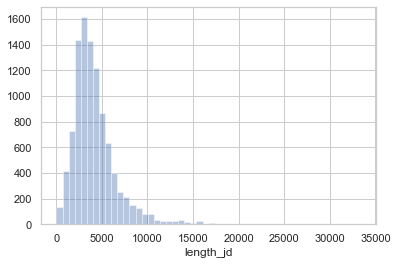

In [0]:
# PART 2.1D :
#Self Defined Text Analysis: we will analyse the length og job description of posts, 
#this will give us an idea about the distribution of job posts by length of the job description and might be an
#important variable in future EDA or Modelling

df_text['length_jd'] = df_text['job_description'].apply(len)
df_text.head()
pd.set_option('display.max_columns', None)

# Getting the Summary Statistics for the 'length_jd' Column:
df_text['length_jd'].describe()

# Plotting the length_jd as a Histogram:

sns.distplot(df_text['length_jd'], kde = False)


In [0]:
#Observations from self-defined text analysis: 
    #the length of the JD is on an avg around 3500 words and its dist plot is like a normal curve skewed towards the left
    # Very few JD > 5000 Words

Secondly, 

<div class="alert alert-block alert-info">

**Code**: 
You are required to find out the words freqency which is more than 6000 in the job descriptions. (Please use stopwords at beginning)


<div class="alert alert-block alert-warning">
    
**Report**: 
    **2.1.B** In your report's section '2.1.B', list those words with frequency > 6000.
</div>
</div>




Then,

<div class="alert alert-block alert-info">

**Code**: 
You are required to sort and display the top 10 high frequency words in 'freq6000'

<div class="alert alert-block alert-warning">
    
**Report**: 
    **2.1.C** In your report's section '2.1.C', list those top 10 words
</div>
</div>






In [0]:
# STEP1:  Converting to Lower Case and Tokenization:

# 1) Converting to LowerCase & Tokenization:
df_text['tokens'] = df_text.lower.apply(word_tokenize)
#df_text.head()

lower = []

for item in df_text['job_description']:
    #print(item)
    lower.append(word_tokenize(item.lower()))  
    #print(word_tokenize(item.lower()))
    
# lowercase description
#lower


In [0]:
def stop_removal(tokens):
    sentence_stop_removed = [] 
    for w in tokens:
        if w not in stopwords_en: 
            sentence_stop_removed .append(w) 
    return (sentence_stop_removed )


stops_removed = stop_removal(lower)


In [0]:
# Your Code to sort and display the top 10 high fequency words in 'freq6000'
stops_removed

[['read',
  'what',
  'people',
  'are',
  'saying',
  'about',
  'working',
  'here',
  '.',
  'we',
  'are',
  'farmers',
  '!',
  'join',
  'a',
  'team',
  'of',
  'diverse',
  'professionals',
  'at',
  'farmers',
  'to',
  'acquire',
  'skills',
  'on',
  'the',
  'job',
  'and',
  'apply',
  'your',
  'learned',
  'knowledge',
  'to',
  'future',
  'roles',
  'at',
  'farmers',
  '.',
  'farmers',
  'insurance',
  'also',
  'offers',
  'extensive',
  'training',
  'opportunities',
  'through',
  'the',
  'award',
  'winning',
  'university',
  'of',
  'farmers',
  'named',
  'by',
  'training',
  'magazine',
  'amongst',
  'top',
  '10',
  'corporate',
  'training',
  'units',
  'in',
  'the',
  'world',
  '.',
  'start',
  'your',
  'career',
  'at',
  'farmers',
  'today',
  '!',
  'job',
  'summary',
  'the',
  'enterprise',
  'data',
  'scientist',
  'i',
  'will',
  'be',
  'a',
  'valuable',
  'part',
  'of',
  'the',
  'data',
  'science',
  'team',
  'who',
  'provide',


Finally,

<div class="alert alert-block alert-info">

**Code**: 
You are required to carry out one more analytics on this data set, and implement it below.

<div class="alert alert-block alert-warning">
    
**Report**: 
    **2.1.D** In your report's section '2.1.D', describe your self-defined text analysis task, and the discovery from your analysis.
</div>
</div>







In [0]:
# For Self - Defined Text Analysis Scroll Little Above:
